In [1]:
import pandas as pd
import os
import json
import datetime as dt
from typing import List



df = pd.DataFrame()

## LOAD DATA

Combine to same dataframe and rename the columns for  better understanding.

In [2]:
dfs = {}
company_list = []
data_dir = "data/"

for file in os.listdir(data_dir):
    if '.csv' in file:
        filename = file.split('.')[0].lower()
        if filename == 'usdjpy':
            continue
        company_list.append(filename)
        df = pd.read_csv(data_dir + file)
        dfs[filename] = df

df = pd.DataFrame()

for key in dfs.keys():
    temp_df = dfs[key]
    
    df["date"] = temp_df["Date"]
    df[f"{key}_close"] = temp_df["Close"]
    df[f"{key}_adj_close"] = temp_df["Adj Close"]
renamed_cols = {col: col.lower() for col in df.columns}
df = df.rename(columns=renamed_cols)
df.head()

,date,aapl_close,aapl_adj_close,amzn_close,amzn_adj_close,goog_close,goog_adj_close,ibm_close,ibm_adj_close,meta_close,...,msft_close,msft_adj_close,nflx_close,nflx_adj_close,orcl_close,orcl_adj_close,sap_close,sap_adj_close,tsla_close,tsla_adj_close
0,2018-01-02,43.064999,40.776520,59.450500,59.450500,53.250000,53.250000,147.466537,111.800140,181.419998,...,85.949997,80.391853,201.070007,201.070007,46.630001,42.437164,112.389999,101.210289,21.368668,21.368668
1,2018-01-03,43.057499,40.769421,60.209999,60.209999,54.124001,54.124001,151.520081,114.873291,184.669998,...,86.349998,80.765984,205.050003,205.050003,47.709999,43.420059,113.309998,102.038765,21.150000,21.150000
2,2018-01-04,43.257500,40.958782,60.479500,60.479500,54.320000,54.320000,154.588913,117.199883,184.330002,...,87.110001,81.476837,205.630005,205.630005,48.180000,43.847801,115.050003,103.605698,20.974667,20.974667
3,2018-01-05,43.750000,41.425121,61.457001,61.457001,55.111500,55.111500,155.344162,117.772491,186.850006,...,88.190002,82.486977,209.990005,209.990005,48.470001,44.111725,116.330002,104.758369,21.105333,21.105333
4,2018-01-08,43.587502,41.271263,62.343498,62.343498,55.347000,55.347000,156.281067,118.482750,188.279999,...,88.279999,82.571190,212.050003,212.050003,48.980000,44.575855,114.800003,103.380554,22.427334,22.427334


In [3]:
class InvestmentPortfolio:
    
    def __init__(self, funds: float=0.0):
        self.funds = funds
        self.cash = 0
        
        self.data = dict() 
        self.dates = list()
        
        self.mtm_list = list() 
        self.mtm_pc_list = list() 
        self.hti_list = list() 
        self.hti_pc_list = list() 
        self.mtm_jpy_list = list() 
        self.mtm_jpy_pc_list = list() 
        
        self.__round_up_digits = 3 
        
        
    def bought_stock(self, df: pd.DataFrame, date: str,
                  stock: str, amount: float):
    
        amount = round(amount, self.__round_up_digits)
        if amount > self.funds:
            print(amount, ">", self.funds)
            diff = round(abs(amount - self.funds), 2)
            if diff > 0.05:
                raise Exception("Insufficient Funds")
        
        close_price = df[df.date == date][f"{stock}_close"].values[0]
        close_price = close_price
        
        stock_qty = amount // close_price
        remaining_cash = amount % close_price
        
        self.cash += remaining_cash
        
        self.data[stock] = self.data.get(
            stock,
            {"qty": 0, "allocation": 0.0, "avg_price": 0.0}
        )
        stock_data = self.data[stock]
        stock_data["qty"] += stock_qty
        stock_data["allocation"] += (amount - remaining_cash)
      
        self.funds -= amount
        self.__round_up_values()
        
    def sold_stock(self, df: pd.DataFrame, date: str, stock: str, qty: int=None):
        
        close_price = df[df.date == date][f"{stock}_close"].values[0]
        close_price = close_price
        print("stock data", self.data)
        stock_data = self.data.get(stock, None)
        
        if stock_data is None:
            raise Exception("Stock does not exist in portfolio")
            
        stock_qty = stock_data.get("qty", 0)
        if stock_qty == 0:
            return
        
        if qty is None:
            sell_qty = stock_qty
        else:
            if qty > stock_qty:
                raise Exception("Invalid qty")
            sell_qty = qty
        
        self.funds += sell_qty * close_price
        
        stock_data["qty"] -= sell_qty
        if stock_data["qty"] == 0:
            stock_data["allocation"] = 0.0
            stock_data["avg_price"] = 0.0
            
        self.__round_up_values()
        
    def rebalanced_port_det(self, df: pd.DataFrame, row_num: int=5,
                  is_buy_high: bool=False, days_interval: int=5,
                  show_intermediate_values: bool =True):
   
        date = df.date[row_num]
        for stock in self.__get_companies():
            self.sold_stock(df, date, stock)
    
        self.allocate_funds()
        
        amount_per_stock = self.funds / 5
        
   
        buy_stock_list = self.get_stock_write_adjas_close(df, row_num, is_buy_high, days_interval)
        for stock in buy_stock_list:
            self.bought_stock(df, date, stock, amount_per_stock)
            

        self.mtm_list.append(self.mtm)
        
        hti = self.get_hightech_index(df, date)
        self.hti_list.append(hti)
      
        self.dates.append(date)
        if show_intermediate_values:
            print(f"Date: {date}\t MTM: {self.mtm}")
    
    def get_stock_write_adjas_close(self, df: pd.DataFrame, row_num: int,
                                 is_buy_high: bool=False, days_interval: int=5) -> List[str]:
     
        start_date = df.date[row_num - days_interval]
        end_date = df.date[row_num]
        
        all_adj_close = [f"{company}_adj_close" for company in company_list]
        old_adj_close_df = df[df.date == start_date][all_adj_close]
        new_adj_close_df = df[df.date == end_date][all_adj_close]
        
        percentage_change_df = (
            (new_adj_close_df.values[0] - old_adj_close_df.values[0]) / new_adj_close_df
        ) * 100
        

        lowest_5 = sorted(percentage_change_df.values[0], reverse=is_buy_high)[: 5]
        
        buy_stock_list = []
        all_values = list(percentage_change_df.values[0])
  
        for val in lowest_5:
     
            idx = all_values.index(val)
            
            company = company_list[idx]
            buy_stock_list.append(company)
        
        return buy_stock_list
        
  
    @property
    def mtm(self) -> float:
        allocated_money = 0.0
        for stock in self.data:
            allocated_money += self.data.get(stock, {}).get("allocation", 0.0)
            
        total = self.cash + allocated_money
        return total
    
    def get_hightech_index(self, df: pd.DataFrame, date: str) -> float:
       
        all_adj_close = [f"{company}_close" for company in company_list]
        close_df = df[df.date == date][all_adj_close]
        values = close_df.values[0]
        return sum(values) / len(values)
    
    def calc_percentage_change(self):
       
        old = self.mtm_list[0]
        self.mtm_pc_list = [0]
        for i in range(1, len(self.mtm_list)):
            new = self.mtm_list[i]
            percentage_change = ((new - old) / new) * 100
            self.mtm_pc_list.append(percentage_change)
    
    def calc_hti_percentage_change(self):
       
        old = self.hti_list[0]
        self.hti_pc_list = [0]
        for i in range(1, len(self.hti_list)):
            new = self.hti_list[i]
            percentage_change = ((new - old) / new) * 100
            self.hti_pc_list.append(percentage_change)
    
    def calc_mtm_jpy_percentage_change(self):
       
        old = self.mtm_jpy_list[0]
        self.mtm_jpy_pc_list = [0]
        for i in range(1, len(self.mtm_jpy_list)):
            new = self.mtm_jpy_list[i]
            percentage_change = ((new - old) / new) * 100
            self.mtm_jpy_pc_list.append(percentage_change)
    
    def convert_mtm_to_jpy(self, jpy_df: pd.DataFrame):
        
        self.mtm_jpy_list = list()
        for i in range(len(self.dates)):
            usd_value = self.mtm_list[i]
            date = self.dates[i]
            
            jpy_close = jpy_df['close'][jpy_df.date == date].values[0]
            jpy_value = round(usd_value * jpy_close, 2)
            self.mtm_jpy_list.append(jpy_value)
    

    def __get_companies(self) -> List[str]:
        
        return list(self.data.keys())
        
            
    def allocate_funds(self):
        
        self.funds += self.cash
        self.cash = 0
        self.funds = round(self.funds, 2)
    
    def __round_up_values(self):
       
        n = self.__round_up_digits
        self.funds = round(self.funds, n)
        self.cash = round(self.cash, n)
        for stock in self.data.keys():
            stock_data = self.data.get(stock)
            stock_data["allocation"] = round(stock_data.get("allocation", 0.0), n)
            
    def __repr__(self):
        return json.dumps(self.data, indent=4)

1. On Jan 02 2018, you split the $5m into 5 $1m, and use them to buy 5 stocks from the 10 stocks. For example, IBM close price was $154.25. With $1m, you can buy max 6482 shares with cost $999848.5 with $151.5 cash left. You decided to spend $1m on each of 
['IBM', 'MSFT', 'GOOG', 'AAPL', 'AMZN'] respectively and keep the rest cash into a zero-interest cash account. On Jan 02 2018,
your mark to market value (MTM) is $5m if combining all stocks value and cash. Your holdings of stocks and cach account is your
portfolio.

In [4]:
def portfolio(df):
    portfolioClass = InvestmentPortfolio(5_000_000)
    amount = 1_000_000
    for company in ['aapl', 'amzn', 'goog', 'msft', 'ibm']:
        portfolioClass.bought_stock(df, "2018-01-02", company, amount)
    return portfolioClass

portfolio_res = portfolio(df)

print(portfolio_res)

{
    "aapl": {
        "qty": 23220.0,
        "allocation": 999969.277,
        "avg_price": 0.0
    },
    "amzn": {
        "qty": 16820.0,
        "allocation": 999957.41,
        "avg_price": 0.0
    },
    "goog": {
        "qty": 18779.0,
        "allocation": 999981.75,
        "avg_price": 0.0
    },
    "msft": {
        "qty": 11634.0,
        "allocation": 999942.265,
        "avg_price": 0.0
    },
    "ibm": {
        "qty": 6781.0,
        "allocation": 999970.587,
        "avg_price": 0.0
    }
}


In [5]:
portfolio_res.mtm

5000000.0

2. Your trading strategy is "5 days rebalancing of buying low". Here is how it works. You keep your portfolio unchanged until 5 days later on Jan 09 2018. Now you want to re-check the market and adjust your portfolio. You will compute the "Adj Close" price
changes from Jan 02 to Jan 09, and find the 5 stocks whose "Adj Close" prices dropped the most in terms of percentage. You sell all current holdings on Jan 09 "Close" prices to convert your portfolio to all cash. Then immediately split your cash, including your cash
account, to 5 equal parts to buy the 5 stocks that dropped the most from Jan 02 to Jan 09 on 'Adj Close' prices. You always buy the max shares of stock on the "Close" price and keep the rest cash in cash account. Now the portfolio should be different from 5 days
ago. This operation is called "rebalancing"

In [6]:

iteration_index = 0
start_date = df.date[iteration_index]
end_date = df.date[iteration_index + 5]


company_adjusted_close_columns = [f"{company}_adj_close" for company in company_list]
start_adj_close_df = df[df.date == start_date][company_adjusted_close_columns]
end_adj_close_df = df[df.date == end_date][company_adjusted_close_columns]


In [7]:
start_adj_close_df

,aapl_adj_close,amzn_adj_close,goog_adj_close,ibm_adj_close,meta_adj_close,msft_adj_close,nflx_adj_close,orcl_adj_close,sap_adj_close,tsla_adj_close
0,40.77652,59.4505,53.25,111.80014,181.419998,80.391853,201.070007,42.437164,101.210289,21.368668


In [8]:
end_adj_close_df

,aapl_adj_close,amzn_adj_close,goog_adj_close,ibm_adj_close,meta_adj_close,msft_adj_close,nflx_adj_close,orcl_adj_close,sap_adj_close,tsla_adj_close
5,41.266521,62.634998,55.313,118.743721,187.869995,82.515045,209.309998,44.822536,102.80423,22.246


In [9]:

percentage_change_df = ((end_adj_close_df.values[0] - start_adj_close_df.values[0]) /  end_adj_close_df) * 100
percentage_change_df

,aapl_adj_close,amzn_adj_close,goog_adj_close,ibm_adj_close,meta_adj_close,msft_adj_close,nflx_adj_close,orcl_adj_close,sap_adj_close,tsla_adj_close
5,1.187406,5.084215,3.729684,5.847535,3.433224,2.573097,3.93674,5.321814,1.550462,3.943774


In [10]:

lowest_5_changes = sorted(percentage_change_df.values[0])[:5]
all_changes = list(percentage_change_df.values[0])
buy_stock_list = []

for change_value in lowest_5_changes:
    index = all_changes.index(change_value)
    company = company_list[index]
    buy_stock_list.append(company)

buy_stock_list

['aapl', 'sap', 'msft', 'meta', 'goog']

In [11]:

portfolio_res = portfolio(df)
portfolio_res.data

{'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0},
 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0},
 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0},
 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0},
 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}

In [12]:

sell_date = "2018-01-09"
for stock in portfolio_res.data.keys():
    portfolio_res.sold_stock(df, sell_date, stock)

portfolio_res.data



stock data {'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'al

{'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'goog': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'msft': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}}

In [13]:
portfolio_res.funds, portfolio_res.cash

(5192656.415, 178.711)

In [14]:

portfolio_res.allocate_funds()


portfolio_res.funds

5192835.13

3. Corporations generally issue stock dividends on some days. The total dividend you get on such a day is the stock dividend times
your shares if you have shares of this stock on the dividend day. If you buy shares on the dividend day, these bought shares are not qualified to get dividend. If you sell shares on the dividend day, the sold shares are qualified to get dividend.

In [15]:
divide = portfolio_res.funds / 5
for stock in buy_stock_list:
    portfolio_res.bought_stock(df, "2018-01-09", stock, divide)

In [16]:
portfolio_res.data

{'aapl': {'qty': 23829.0, 'allocation': 1038527.393, 'avg_price': 0.0},
 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'goog': {'qty': 18776.0, 'allocation': 1038556.888, 'avg_price': 0.0},
 'msft': {'qty': 11772.0, 'allocation': 1038525.852, 'avg_price': 0.0},
 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'sap': {'qty': 9097.0, 'allocation': 1038513.556, 'avg_price': 0.0},
 'meta': {'qty': 5528.0, 'allocation': 1038545.332, 'avg_price': 0.0}}

4. 5 business days later on Jan 17 (Jan 15 was a holiday), you re-check the market and adjust your portfolio again. You will have a
new portfolio on Jan 17

In [17]:
rebalance_rownumber = list(df.date.values).index("2018-01-17")

In [18]:
portfolio_res.rebalanced_port_det(df, row_num =rebalance_rownumber, is_buy_high=False, days_interval=5)

stock data {'aapl': {'qty': 23829.0, 'allocation': 1038527.393, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18776.0, 'allocation': 1038556.888, 'avg_price': 0.0}, 'msft': {'qty': 11772.0, 'allocation': 1038525.852, 'avg_price': 0.0}, 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'sap': {'qty': 9097.0, 'allocation': 1038513.556, 'avg_price': 0.0}, 'meta': {'qty': 5528.0, 'allocation': 1038545.332, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18776.0, 'allocation': 1038556.888, 'avg_price': 0.0}, 'msft': {'qty': 11772.0, 'allocation': 1038525.852, 'avg_price': 0.0}, 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'sap': {'qty': 9097.0, 'allocation': 1038513.556, 'avg_price': 0.0}, 'meta': {'qty': 5528.0, 'allocation': 1038545.332, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0

In [19]:
portfolio_res.data

{'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'goog': {'qty': 18319.0, 'allocation': 1036837.063, 'avg_price': 0.0},
 'msft': {'qty': 11502.0, 'allocation': 1036790.268, 'avg_price': 0.0},
 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0},
 'sap': {'qty': 9324.0, 'allocation': 1036735.579, 'avg_price': 0.0},
 'meta': {'qty': 5838.0, 'allocation': 1036828.835, 'avg_price': 0.0},
 'orcl': {'qty': 20625.0, 'allocation': 1036818.75, 'avg_price': 0.0}}

In [20]:
portfolio_res.allocate_funds()
portfolio_res.funds

198.3

5. If you run this strategy every 5 days all the way to Dec 31 2018, you will have a daily MTM. You expect the MTM on Dec 31 2018
should be higher than $5m because you always buy the stocks that dropped the most, i.e., you always buy low

In [21]:
portfolio_res = portfolio(df)
portfolio_res

{
    "aapl": {
        "qty": 23220.0,
        "allocation": 999969.277,
        "avg_price": 0.0
    },
    "amzn": {
        "qty": 16820.0,
        "allocation": 999957.41,
        "avg_price": 0.0
    },
    "goog": {
        "qty": 18779.0,
        "allocation": 999981.75,
        "avg_price": 0.0
    },
    "msft": {
        "qty": 11634.0,
        "allocation": 999942.265,
        "avg_price": 0.0
    },
    "ibm": {
        "qty": 6781.0,
        "allocation": 999970.587,
        "avg_price": 0.0
    }
}

In [22]:
for i in range(5, len(df.date.values), 5):
    portfolio_res.rebalanced_port_det(df, i)

stock data {'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'al

In [23]:
for stock in company_list:
    print("stock", stock)
    portfolio_res.sold_stock(df, "2018-12-28", stock)

stock aapl
stock data {'aapl': {'qty': 26539.0, 'allocation': 1000055.841, 'avg_price': 0.0}, 'amzn': {'qty': 14520.0, 'allocation': 1000028.671, 'avg_price': 0.0}, 'goog': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'msft': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'sap': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'meta': {'qty': 8003.0, 'allocation': 999974.826, 'avg_price': 0.0}, 'orcl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'tsla': {'qty': 46911.0, 'allocation': 1000048.745, 'avg_price': 0.0}, 'nflx': {'qty': 4058.0, 'allocation': 999850.616, 'avg_price': 0.0}}
stock amzn
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 14520.0, 'allocation': 1000028.671, 'avg_price': 0.0}, 'goog': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'msft': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'ibm': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'sap

In [24]:
portfolio_res.allocate_funds()

In [25]:
portfolio_res.funds

5259291.49

6. Another strategy is "5 days rebalancing of buying high". You always buy the 5 stocks whose "Adj Close" prices surge the most in
terms of percentage because you believe the trend will continue. Run the new strategy and see how the MTM will change

In [26]:
buy_high_portfolio = portfolio(df)

In [27]:
five_highest = sorted(percentage_change_df.values[0], reverse=True)[: 5]
stock_values = list(percentage_change_df.values[0])
buy_stock_list = []
for val in five_highest :
    idx = stock_values.index(val)
    company = company_list[idx]
    buy_stock_list.append(company)
    
buy_stock_list

['ibm', 'orcl', 'amzn', 'tsla', 'nflx']

In [28]:
for stock in buy_high_portfolio.data.keys():
    buy_high_portfolio.sold_stock(df, "2018-01-09", stock)

stock data {'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'al

In [29]:
buy_high_portfolio.allocate_funds()

In [30]:
buy_high_portfolio.cash, buy_high_portfolio.funds

(0, 5192835.13)

In [31]:
split = buy_high_portfolio.funds / 5
for stock in buy_stock_list:
    buy_high_portfolio.bought_stock(df, "2018-01-09", stock, split)

In [32]:
buy_high_portfolio = portfolio(df)

In [33]:
for i in range(5, len(df.date.values), 5):
    buy_high_portfolio.rebalanced_port_det(df, i, True)

stock data {'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'al

In [34]:
for stock in company_list:
    buy_high_portfolio.sold_stock(df, "2018-12-28", stock)

stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18980.0, 'allocation': 929583.479, 'avg_price': 0.0}, 'msft': {'qty': 9463.0, 'allocation': 929550.518, 'avg_price': 0.0}, 'ibm': {'qty': 8765.0, 'allocation': 929626.313, 'avg_price': 0.0}, 'orcl': {'qty': 21127.0, 'allocation': 929588.0, 'avg_price': 0.0}, 'tsla': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'nflx': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'meta': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'sap': {'qty': 9669.0, 'allocation': 929577.65, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18980.0, 'allocation': 929583.479, 'avg_price': 0.0}, 'msft': {'qty': 9463.0, 'allocation': 929550.518, 'avg_price': 0.0}, 'ibm': {'qty': 8765.0, 'allocation': 929626.313, 'avg_price': 0.0}, 'orcl': {'qty'

7. You will create a "high tech index" which is simply the daily average of the 10 stocks "Close" prices. Compare your MTM series with the "high tech index" and plot their curves. To plot the two curves together, you may want to convert the series to daily percentage
change with regard to Jan 02 2018

In [35]:
import matplotlib.pyplot as plt

In [36]:
portfolio_res.calc_percentage_change()
portfolio_res.calc_hti_percentage_change()

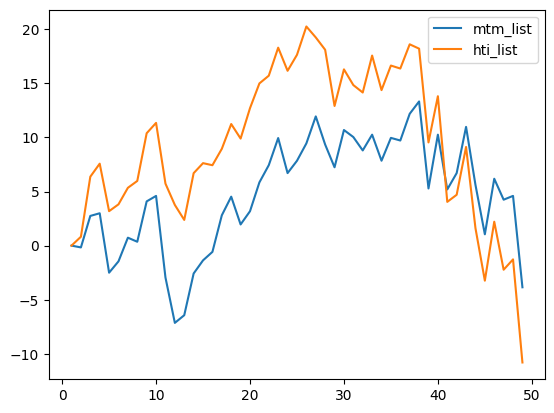

In [37]:
x_axis = [i for i in range(1, len(portfolio_res.mtm_pc_list) + 1)]
plt.plot(x_axis, portfolio_res.mtm_pc_list, label='mtm_list')
plt.plot(x_axis, portfolio_res.hti_pc_list, label='hti_list')
plt.legend()
plt.show()

8. Convert to JPY

In [38]:
jpy = pd.read_csv('data/USDJPY.csv')

In [39]:
jpy_renamed_cols = {col: col.lower() for col in jpy.columns}
jpy= jpy.rename(columns=jpy_renamed_cols)
jpy.head()

,date,open,high,low,close,adj close,volume
0,2018-01-01,112.680000,112.690002,112.669998,112.666000,112.666000,0
1,2018-01-02,112.769997,112.788002,112.074997,112.769997,112.769997,0
2,2018-01-03,112.264000,112.485001,112.193001,112.244003,112.244003,0
3,2018-01-04,112.606003,112.853996,112.507004,112.607002,112.607002,0
4,2018-01-05,112.790001,113.289001,112.731003,112.782997,112.782997,0


In [40]:
portfolio_res.convert_mtm_to_jpy(jpy)

In [41]:
portfolio_res.calc_mtm_jpy_percentage_change()

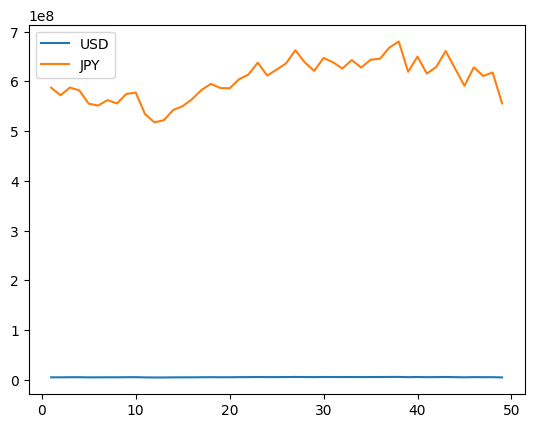

In [42]:
x_axis = [i for i in range(1, len(portfolio_res.mtm_list) + 1)]
plt.plot(x_axis, portfolio_res.mtm_list, label='USD')
plt.plot(x_axis, portfolio_res.mtm_jpy_list, label='JPY')
plt.legend()
plt.show()

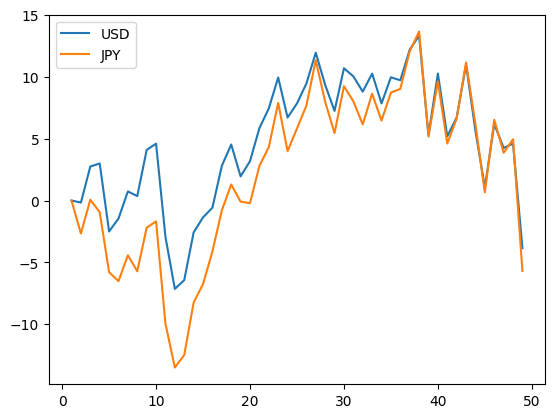

In [43]:
x_axis = [i for i in range(1, len(portfolio_res.mtm_list) + 1)]
plt.plot(x_axis, portfolio_res.mtm_pc_list, label='USD')
plt.plot(x_axis, portfolio_res.mtm_jpy_pc_list, label='JPY')
plt.legend()
plt.show()

9. The above two strategies both rebalance every 5 days. Try to change the days interval and find the optimal days interval that
maximizes the MTM on 12/31/2018

In [44]:
result = []

start = 1
end = len(df.date) // 2


for days_interval in range(start, end):
    print(f"{days_interval=}")
    
    if days_interval in [43, 44]:
        continue
    
    for is_buy_high in [True, False]:
        print(f"\t{is_buy_high=}", end="\t")

        portfolio_res = portfolio(df)

        for i in range(days_interval, len(df.date.values) - days_interval, days_interval):
            portfolio_res.rebalanced_port_det(df, i, is_buy_high, days_interval, show_intermediate_values=False)
        print(f"MTM: {portfolio_res.mtm}")
        
        sell_date = df.date.values[i + days_interval]
        
        for stock in portfolio_res.data.keys():
            portfolio_res.sold_stock(df, sell_date, stock)
        print(f"\t\t\t\tFunds: {portfolio_res.funds}")
        portfolio_res.allocate_funds()
        
        result.append({
            "days_interval": days_interval,
            "is_buy_high": is_buy_high,
            "funds": portfolio_res.funds
        })

days_interval=1
	is_buy_high=True	stock data {'aapl': {'qty': 23220.0, 'allocation': 999969.277, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 16820.0, 'allocation': 999957.41, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price': 0.0}, 'ibm': {'qty': 6781.0, 'allocation': 999970.587, 'avg_price': 0.0}}
stock data {'aapl': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'amzn': {'qty': 0.0, 'allocation': 0.0, 'avg_price': 0.0}, 'goog': {'qty': 18779.0, 'allocation': 999981.75, 'avg_price': 0.0}, 'msft': {'qty': 11634.0, 'allocation': 999942.265, 'avg_price'

In [45]:
sorted(result, key = lambda x: x['funds'], reverse=True)[0]

{'days_interval': 63, 'is_buy_high': False, 'funds': 6553831.38}

#### When day interval is 63, strategy is Buy Low it is the best portfolio
#### MTM value of USD 6553831.38